# Часть II проекта "Прогнозирование стоимости жилья".
В этой части нас ждет:
* Разведывательный анализ данных (EDA).
* Отбор и преобразование признаков.
* Построение моделtq для прогнозирования стоимости недвижимости:
 - Линейная регрессия.
 - Модель случайного леса.
 - Градиентный бустинг.

In [44]:
# импортируем библиотеки

import pandas as pd
import category_encoders as ce

from sklearn import preprocessing
from sklearn.feature_selection import f_classif
from sklearn import model_selection
from sklearn.feature_selection import SelectKBest, f_regression
from sklearn import linear_model
from sklearn import metrics
from sklearn import tree
from sklearn.model_selection import GridSearchCV
from sklearn import ensemble

import scipy.stats as stats

import seaborn as sns
import plotly.express as px
import matplotlib.pyplot as plt
%matplotlib inline

import warnings
warnings.filterwarnings("ignore")

## Разведывательный анализ данных (EDA).

Пора приступить к исследованию полученного набора данных. Попробуем найти закономерности, позволяющие сформулировать предварительные гипотезы относительно того, какие факторы являются решающими в определении стоимости объектов недвижимости.

In [45]:
# загрузим данные из полученного в 1 части датафрейма
data_copy = pd.read_csv('./data/processed_data.csv')
data_copy.head(2)

,status,propertyType,fireplace,sqft,beds,state,stories,target,Year built,Heating,Cooling,Parking,lotsize,Price/sqft,school_rating_count,privatePool,propertyTypeCount,MLS
0,active,single family,1,2900.0,4.0,NC,0.0,418000,2019.0,central,no data,no data,0.0,144.0,8,False,1,True
1,for sale,single family,0,1947.0,3.0,WA,2.0,310000,2019.0,no data,no data,no data,0.0,159.0,3,False,1,True


### Посмотрим на целевой признак.

Построим гистограмму и коробчатую диаграмму стоимости.

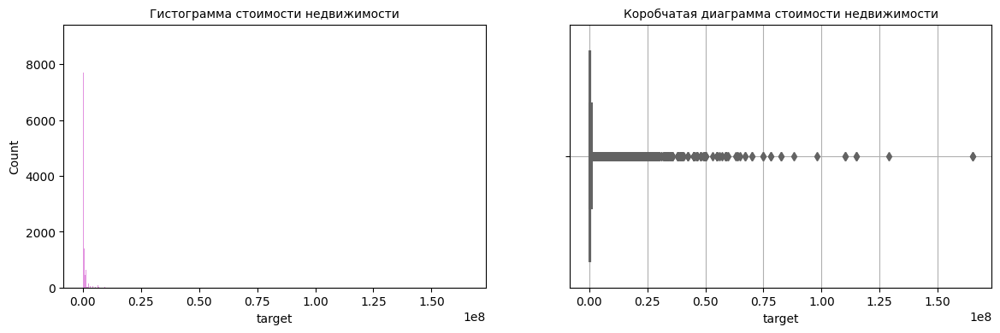

In [46]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(14, 4))

sns.histplot(
    data=data_copy,
    x='target',
    ax=axes[0],
    color='orchid'
    );
axes[0].set_title('Гистограмма стоимости недвижимости', fontsize=10)

sns.boxplot(
    data=data_copy,
    x='target',
    ax=axes[1],
    color='orchid'
);

axes[1].set_title('Коробчатая диаграмма стоимости недвижимости', fontsize=10)
axes[1].grid()

<img src="visualisation/06.png?raw=true">

Целевой признак не распределен нормально, давайте проведем тест Д’Агостино при уровне значимости 0.05, для убедительности.

In [47]:
H0 = 'Данные распределены нормально'
Ha = 'Данные не распределены нормально (мы отвергаем H0)'
alpha = 0.05

_, p = stats.normaltest(data_copy['target'])
print('p=%.4f' % p)

# Интерпретация 

if p > alpha/2:
	print(H0)
else:
	print(Ha)

p=0.0000
Данные не распределены нормально (мы отвергаем H0)


### Проанализируем целевой признак в разрезе других признаков.

Посмотрим, какое влияние оказывает статус недвижимости на стоимость.

In [48]:
# сгруппируем данные о стоимости по статусом и возьмем медианное и среднее значения
grouped_by_status = data_copy.groupby(['status'])[['target']].median()
grouped_by_status.columns =['median_price']
grouped_by_status = grouped_by_status.reset_index()

# построим диаграмму
fig = px.bar(
    data_frame=grouped_by_status,
    y='median_price',
    x='status',
    height=800,
    width=1300,
    color='status',
    color_continuous_scale=px.colors.sequential.Purpor,
    title='Медианная стоимость недвижимости в зависимости от статуса'
    )

fig.show()

<img src="visualisation/07.png?raw=true">

Мы видим, что если объект сдается в аренду, то его цена минимальна, и это логично. А вот все остальные статусы оставим на рассмотрение модели :)

Посмотрим, как наша меняется стоимость объектов в зависимости от штатов.

In [49]:
# сгруппируем данные о стоимости по штатам и возьмем медиану
grouped_by_state = data_copy.groupby(['state'])[['target']].median()
grouped_by_state.columns =['median_price']
grouped_by_state = grouped_by_state.reset_index()

# построим диаграмму
fig = px.bar(
    data_frame=grouped_by_state,
    y='median_price',
    x='state',
    orientation='v',
    height=800,
    width=1200,
    color='state',
    color_continuous_scale=px.colors.sequential.Purpor,
    title='Медианная стоимость недвижимости по штатам'
    )

fig.show()

<img src="visualisation/08.png?raw=true">

Можно четко отследить, что есть штаты, где недвижимость довольно дорогая, а есть те, где стоит в десятки раз меньше. Штат - отличный признак, надеюсь, он поможет нам в предсказании цен.

Посмотрим, как влияет наличие бассейна на стоимость недвижимости.

Text(0.5, 1.0, 'Коробчатая диаграмма распределения цен в зависимости от наличия бассейна')

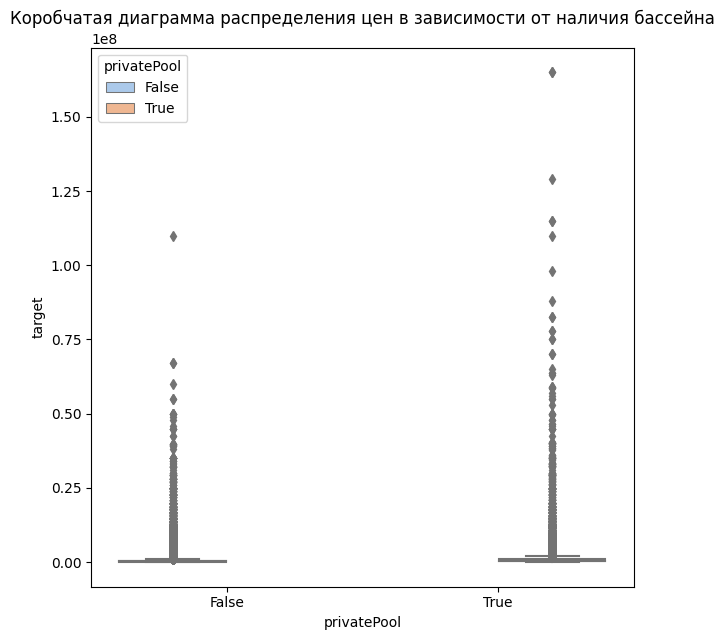

In [50]:
# построим коробчатую диаграмму
fig = plt.figure(figsize=(7, 7))
boxplot = sns.boxplot(
    data=data_copy,
    x='privatePool',
    y='target',
    hue='privatePool',
    palette='pastel'
    );
boxplot.set_title('Коробчатая диаграмма распределения цен в зависимости от наличия бассейна')

<img src="visualisation/09.png?raw=true">

В среднем стоимость объектов с бассейном выше, чем тех, где он отсутствует, что тоже вполне поддается логике.
Давайте оценим созданные мной категории по годам, а также обычный признак года постройки объекта.

In [51]:
# посмотрим на взаимосвязь года постройки и целевого признака

fig = px.scatter(
    data_copy, 
    y='Year built', 
    x='target', 
    color='target',
    height=1000,
    width=1000,
    title='Взаимосвязь года постройки и стоимости объекта',
    color_continuous_scale=px.colors.diverging.Tealrose,
    log_x=True,
    log_y=True
    )

fig.show()

<img src="visualisation/10.png?raw=true">

В общем-то какой-то особой связи между годом постройки и ценой нет. Скорее всего я удалю этот признак.

## Отбор и преобразование признаков.

### Кодирование признаков.

In [52]:
# посмотрим на основную информацию о нечисловых признаках
data_copy.describe(include='object')

,status,propertyType,state,Heating,Cooling,Parking
count,309001,309001,309001,306794,308872,309001
unique,40,29,37,28,28,13
top,for sale,single family,FL,forced air,central,no data
freq,168400,170125,94615,135810,198229,205378


Для кодирования Parking, нам подходит OneHot Encoding, для остальных принаков - Binary Encoding.

In [53]:
#закодируем признак Parking
data_copy_dummies = pd.get_dummies(data_copy, columns=['Parking'])

# посмотрим, что получилось
data_copy_dummies.head(3)

,status,propertyType,fireplace,sqft,beds,state,stories,target,Year built,Heating,...,Parking_driveway,Parking_garage,Parking_guest,Parking_no data,Parking_off street,Parking_on street,Parking_parking,Parking_private,Parking_public,Parking_under building
0,active,single family,1,2900.0,4.0,NC,0.0,418000,2019.0,central,...,False,False,False,True,False,False,False,False,False,False
1,for sale,single family,0,1947.0,3.0,WA,2.0,310000,2019.0,no data,...,False,False,False,True,False,False,False,False,False,False
2,for sale,single family,1,3000.0,3.0,CA,1.0,2895000,1961.0,forced air,...,False,False,False,False,False,False,False,False,False,False


In [54]:
# закодируем оставшиеся признаки
object_columns_list = ['status', 'propertyType', 'state', 'Heating', 'Cooling']
bin_encoder = ce.BinaryEncoder(cols=object_columns_list)
type_bin = bin_encoder.fit_transform(data_copy_dummies[object_columns_list])
data_copy_dummies = pd.concat([data_copy_dummies, type_bin], axis=1)

# удалим закодированные признаки
data_copy_dummies.drop(object_columns_list, axis=1 , inplace=True)

data_copy_dummies.head(3)

,fireplace,sqft,beds,stories,target,Year built,lotsize,Price/sqft,school_rating_count,privatePool,...,Heating_0,Heating_1,Heating_2,Heating_3,Heating_4,Cooling_0,Cooling_1,Cooling_2,Cooling_3,Cooling_4
0,1,2900.0,4.0,0.0,418000,2019.0,0.0,144.0,8,False,...,0,0,0,0,1,0,0,0,0,1
1,0,1947.0,3.0,2.0,310000,2019.0,0.0,159.0,3,False,...,0,0,0,1,0,0,0,0,0,1
2,1,3000.0,3.0,1.0,2895000,1961.0,0.0,965.0,3,True,...,0,0,0,1,1,0,0,0,1,0


### Корреляция признаков.

In [55]:
# создадим список всех колонок, чтобы слегка автоматизировать процесс
all_columns = data_copy_dummies.columns.tolist()

# непрерывные признаки:
num_cols = ['fireplace', 'sqft', 'beds', 
            'stories', 'lotsize', 'Price/sqft',
            'school_rating_count', 'propertyTypeCount'
            ]

# категориальные признаки:
cat_cols = all_columns.copy()

for item in num_cols:
    cat_cols.remove(item)
    
cat_cols.remove('target')

print(f'{len(num_cols)} непрерывных признаков: {num_cols}')
print(f'{len(cat_cols)} категориальных признаков: {cat_cols}')

8 непрерывных признаков: ['fireplace', 'sqft', 'beds', 'stories', 'lotsize', 'Price/sqft', 'school_rating_count', 'propertyTypeCount']
43 категориальных признаков: ['Year built', 'privatePool', 'MLS', 'Parking_assigned', 'Parking_attached', 'Parking_detached', 'Parking_driveway', 'Parking_garage', 'Parking_guest', 'Parking_no data', 'Parking_off street', 'Parking_on street', 'Parking_parking', 'Parking_private', 'Parking_public', 'Parking_under building', 'status_0', 'status_1', 'status_2', 'status_3', 'status_4', 'status_5', 'propertyType_0', 'propertyType_1', 'propertyType_2', 'propertyType_3', 'propertyType_4', 'state_0', 'state_1', 'state_2', 'state_3', 'state_4', 'state_5', 'Heating_0', 'Heating_1', 'Heating_2', 'Heating_3', 'Heating_4', 'Cooling_0', 'Cooling_1', 'Cooling_2', 'Cooling_3', 'Cooling_4']


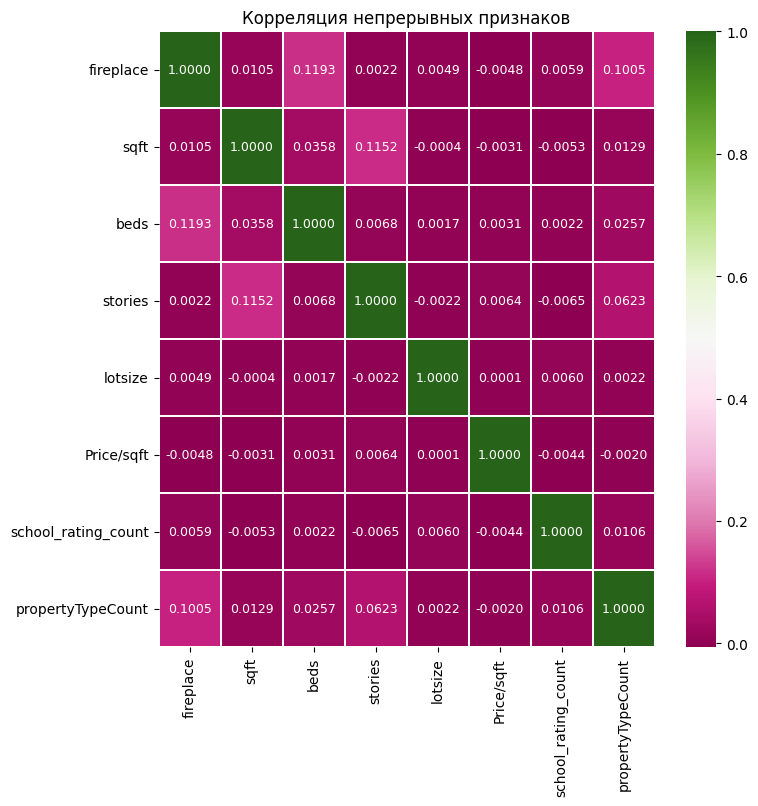

In [56]:
# построим матрицу корреляции для непрерывнх признаков

fig_, ax_ = plt.subplots(figsize=(8, 8))
corr = data_copy_dummies[num_cols].corr(method='pearson')
sns.heatmap(corr, 
            annot=True, 
            annot_kws={"fontsize":9}, 
            linewidths=0.1, 
            ax=ax_, 
            cmap='PiYG',
            fmt='.4f')
ax_.set_title('Корреляция непрерывных признаков', fontsize=12)
plt.show()

<img src="visualisation/11.png?raw=true">

Среди числовых признаков нет сильно скоррелированных, посмотрим теперь категориальные признаки.

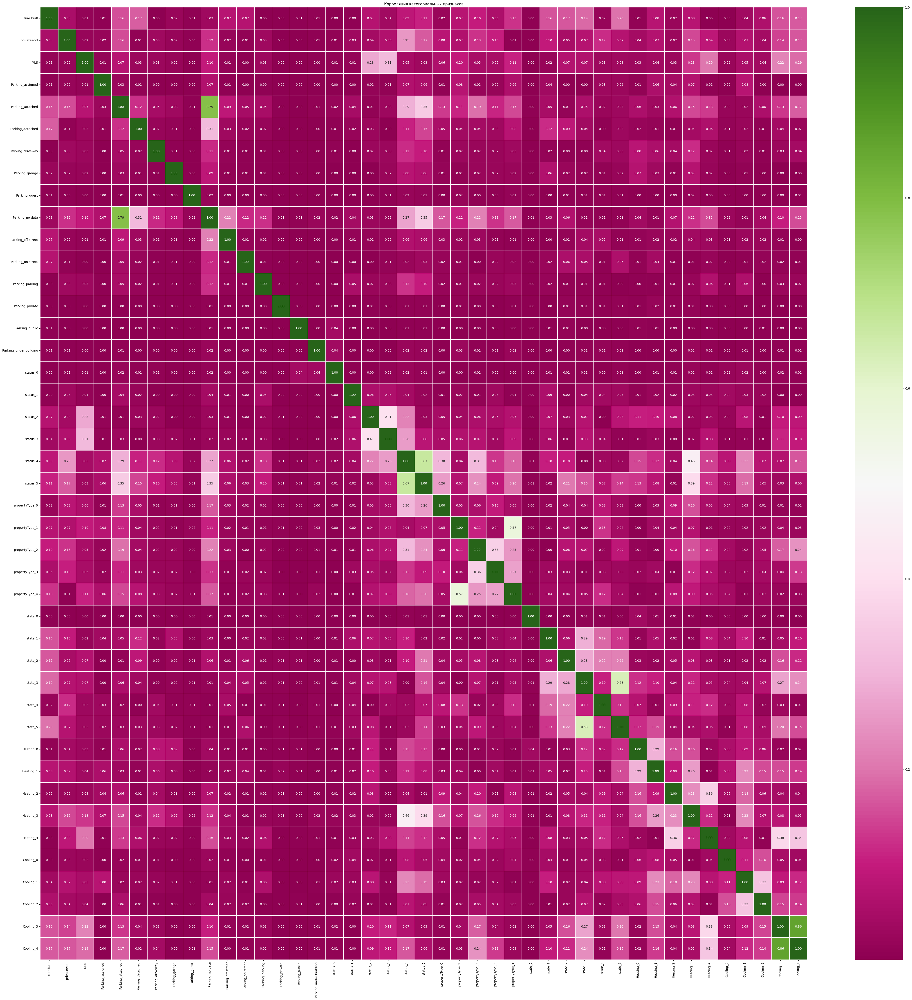

In [57]:
# построим матрицу корреляции для категориальных признаков

fig_, ax_ = plt.subplots(figsize=(55, 55))
corr = data_copy_dummies[cat_cols].corr(method='spearman').abs()
sns.heatmap(corr, 
            annot=True, 
            annot_kws={"fontsize":10}, 
            linewidths=0.1, 
            ax=ax_, 
            cmap='PiYG',
            fmt='.2f')
ax_.set_title('Корреляция категориальных признаков', fontsize=12)
plt.show()

<img src="visualisation/12.png?raw=true">

Так как признаков довольно много, будет гораздо проще разглядеть результат, если вывести все значения в текстовом виде.

In [58]:
# выведем на экран признаки, корреляция которых больше 0,7

corr = data_copy_dummies[cat_cols].corr(method='spearman')
print('Наиболее высокая корреляция между признаками:')
corr_unstack = corr.abs().unstack().reset_index()
corr_unstack = corr_unstack.rename(columns = {'level_0' : 'feature 1', 'level_1' : 'feature 2',0 : 'Corr ind' }).\
     sort_values(by = 'Corr ind', ascending = False)
corr_unstack[((corr_unstack['feature 1'] != corr_unstack['feature 2']) & ((corr_unstack['Corr ind'] > .7)) | (corr_unstack['Corr ind'] < -.7))].\
  iloc[0::2,:].reset_index(drop = True)

Наиболее высокая корреляция между признаками:


,feature 1,feature 2,Corr ind
0,Cooling_3,Cooling_4,0.857413
1,Parking_attached,Parking_no data,0.786397


Признаки Cooling_3/Cooling_4, Parking_no data	Parking_attached рассматриваются в комплексе, поэтому, пожалуй, я пока их оставлю.
Проведем оценку значимости всех признаков с помощью теста ANOVA.

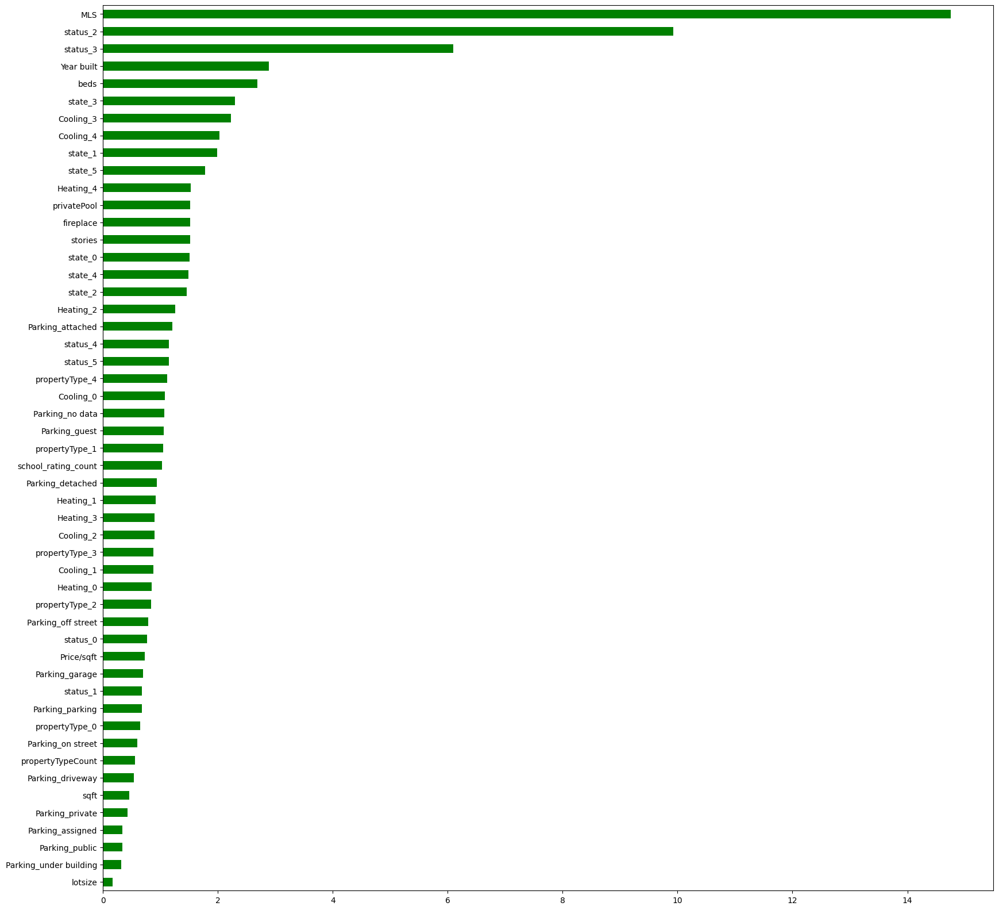

In [59]:
# выделим целевой признак
y = data_copy_dummies.target.values
X = data_copy_dummies.drop(['target'], axis=1)

# визуализируем результат анализа значимости:
imp_num = pd.Series(f_classif(
    X[X.columns], y = data_copy_dummies.target.values
    )[0], index = X.columns)
imp_num.sort_values(inplace = True)

fig5, ax5 = plt.subplots(figsize=(20, 20))
imp_num.plot(kind = 'barh', color='green');

<img src="visualisation/13.png?raw=true">

Теперь попробуем еще один метод - отберем 25 признаков, наилучшим образом подходящих для предсказания целевой переменной в логарифмическом масштабе, с помощью SelectKBest.

In [60]:
# выделим целевой признак 
y = data_copy_dummies.target.values
X = data_copy_dummies.drop(['target'], axis=1)

selector = SelectKBest(f_regression,
                       k=25)
selector.fit(X, y)

select_features = list(selector.get_feature_names_out())
select_features

['fireplace',
 'sqft',
 'beds',
 'stories',
 'Price/sqft',
 'school_rating_count',
 'privatePool',
 'propertyTypeCount',
 'Parking_attached',
 'status_2',
 'status_3',
 'status_4',
 'status_5',
 'propertyType_0',
 'propertyType_1',
 'propertyType_4',
 'state_1',
 'state_2',
 'state_3',
 'state_4',
 'state_5',
 'Heating_2',
 'Heating_3',
 'Heating_4',
 'Cooling_1']

In [61]:
all_features = select_features + ['target']
data_copy_dummies = data_copy_dummies[all_features]
data_copy_dummies.head(2)

,fireplace,sqft,beds,stories,Price/sqft,school_rating_count,privatePool,propertyTypeCount,Parking_attached,status_2,...,state_1,state_2,state_3,state_4,state_5,Heating_2,Heating_3,Heating_4,Cooling_1,target
0,1,2900.0,4.0,0.0,144.0,8,False,1,False,0,...,0,0,0,0,1,0,0,1,0,418000
1,0,1947.0,3.0,2.0,159.0,3,False,1,False,0,...,0,0,0,1,0,0,1,0,0,310000


Разделим набор данных на матрицу наблюдений X (таблица из объектов и их признаков) и столбец правильных ответов y.

In [62]:
#X - матрица наблюдений, y - столбец правильных ответов
X = data_copy_dummies.drop(['target'], axis=1)
y = data_copy_dummies['target']

#Создаем тренировочную и тестовую выборки с помощью train_test_split
X_train, X_test, y_train, y_test = model_selection.train_test_split(
    X, y, #таблица с наблюдениями и столбец с правильным ответами
    test_size=0.2, #размер тестовой выборки
    random_state=42 #число отвечающее за генерацию случайных чисел
)
#Выводим размеры полученных выборок
print('Train shape: {}'.format(X_train.shape))
print('Test shape: {}'.format(X_test.shape))

Train shape: (247200, 25)
Test shape: (61801, 25)


### Нормализация данных.

Нормализуем числовые признаки с помощью RobustScaler, так как мы помним, что у нас еще оставались небольшие были выбросы в данных, а RobustScaler к ним не чувствителен.

In [63]:
# создадим список всех колонок, чтобы слегка автоматизировать процесс
all_columns = X_train.columns.tolist()

# непрерывные признаки:
num_cols = ['fireplace', 'sqft', 'beds', 
            'stories', 'Price/sqft'
            ]

# категориальные признаки:
cat_cols = all_columns.copy()

for item in num_cols:
    cat_cols.remove(item)

print(f'{len(num_cols)} непрерывных признаков: {num_cols}')
print(f'{len(cat_cols)} категориальных признаков: {cat_cols}')

5 непрерывных признаков: ['fireplace', 'sqft', 'beds', 'stories', 'Price/sqft']
20 категориальных признаков: ['school_rating_count', 'privatePool', 'propertyTypeCount', 'Parking_attached', 'status_2', 'status_3', 'status_4', 'status_5', 'propertyType_0', 'propertyType_1', 'propertyType_4', 'state_1', 'state_2', 'state_3', 'state_4', 'state_5', 'Heating_2', 'Heating_3', 'Heating_4', 'Cooling_1']


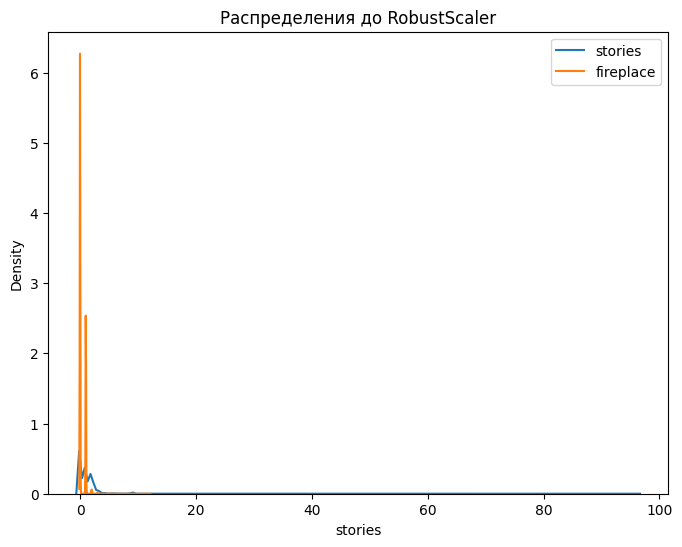

In [64]:
# посмотрим на распределение нескольких признаков до нормализации RobustScaler
fig, (ax1) = plt.subplots(ncols=1, figsize=(8, 6))
ax1.set_title('Распределения до RobustScaler')

sns.kdeplot(X_train['stories'], ax=ax1, label='stories')
sns.kdeplot(X_train['fireplace'], ax=ax1, label='fireplace')

plt.legend()

<img src="visualisation/14.png?raw=true">

In [65]:
col_names = list(X_train.columns)

# инициализируем нормализатор RobustScaler
r_scaler = preprocessing.RobustScaler()

# кодируем исходный датасет
X_train_r = pd.DataFrame(r_scaler.fit_transform(X_train), columns=col_names)
X_tesr_r = pd.DataFrame(r_scaler.transform(X_test), columns=col_names)

X_train_r.head(3)

,fireplace,sqft,beds,stories,Price/sqft,school_rating_count,privatePool,propertyTypeCount,Parking_attached,status_2,...,propertyType_4,state_1,state_2,state_3,state_4,state_5,Heating_2,Heating_3,Heating_4,Cooling_1
0,0.0,0.215613,2.0,-0.5,0.519337,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,-1.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,-0.374721,0.0,0.0,-0.187845,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,-1.0,0.0,1.0,0.0,-1.0,0.0
2,1.0,3.104833,2.0,-0.5,1.552486,5.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,-1.0,-1.0,1.0,1.0,-1.0,0.0,0.0


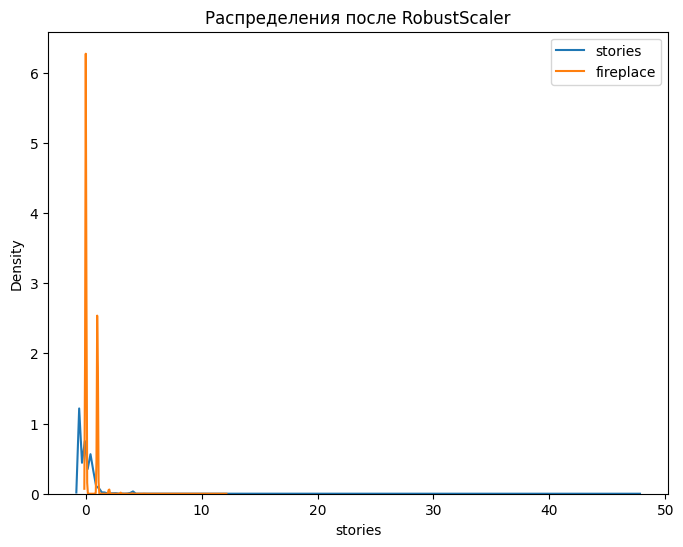

In [66]:
# посмотрим на распределение этих же признаков после нормализации RobustScaler

fig, (ax1) = plt.subplots(ncols=1, figsize=(8, 6))
ax1.set_title('Распределения после RobustScaler')

sns.kdeplot(X_train_r['stories'], ax=ax1, label='stories')
sns.kdeplot(X_train_r['fireplace'], ax=ax1, label='fireplace')

plt.legend()

<img src="visualisation/15.png?raw=true">

Получилось не очень. Попробуем обработать данные другим способом. Воспользуемся методом MinMaxScaler.

In [67]:
# инициализируем нормализатор MinMaxScaler
mm_scaler = preprocessing.MinMaxScaler()

# кодируем исходный датасет
X_train_mm = pd.DataFrame(mm_scaler.fit_transform(X_train), columns=col_names)
X_test_mm = pd.DataFrame(mm_scaler.transform(X_test), columns=col_names)

X_train_mm.head(3)

,fireplace,sqft,beds,stories,Price/sqft,school_rating_count,privatePool,propertyTypeCount,Parking_attached,status_2,...,propertyType_4,state_1,state_2,state_3,state_4,state_5,Heating_2,Heating_3,Heating_4,Cooling_1
0,0.000000,0.001287,0.050505,0.000000,0.000279,0.046154,0.0,0.2,0.0,0.0,...,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0
1,0.000000,0.000795,0.030303,0.010417,0.000144,0.046154,0.0,0.2,0.0,0.0,...,1.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0
2,0.083333,0.003699,0.050505,0.000000,0.000476,0.123077,0.0,0.2,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0


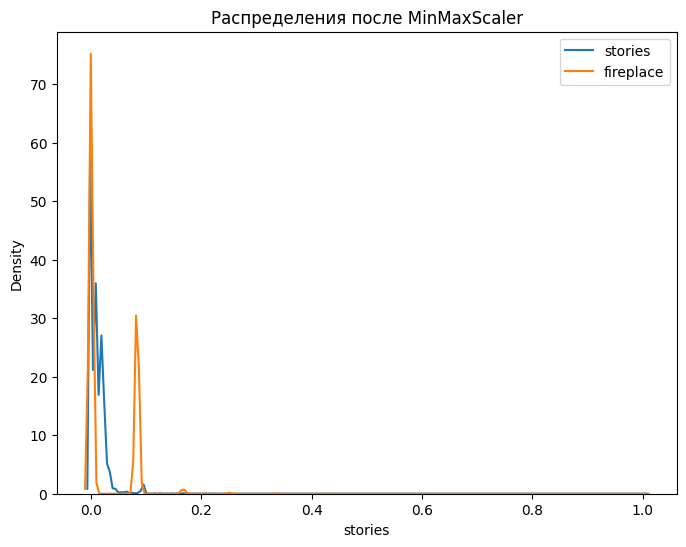

In [68]:
# посмотрим на распределение этих же признаков после нормализации MinMaxScaler

fig, (ax1) = plt.subplots(ncols=1, figsize=(8, 6))
ax1.set_title('Распределения после MinMaxScaler')

sns.kdeplot(X_train_mm['stories'], ax=ax1, label='stories')
sns.kdeplot(X_train_mm['fireplace'], ax=ax1, label='fireplace')

plt.legend()

<img src="visualisation/16.png?raw=true">

Ну так тоже не очень, но получше. Пока оставим так и будем двигаться дальше.

## Построение модели для прогнозирования стоимости недвижимости.

### Линейная регрессия.

Начнем с простого. Построим модель линейной регрессии на обучающей выборке с параметрами по умолчанию.

Заранее создадим функцию, которая будет расчитывать метрики:

1. MAE - средняя абсолютная ошибка (целевая метрика)
2. MAPE - средняя абсолютная ошибка в процентах 
3. $R^2$ - коэффициент детерминации 

In [69]:
def print_metrics(y_train, y_train_predict, y_test, y_test_predict):
    print('Train R^2: {:.3f}'.format(metrics.r2_score(y_train, y_train_predict)))
    print('Train MAE: {:.3f}'.format(metrics.mean_absolute_error(y_train, y_train_predict)))
    print('Train MAPE: {:.3f}'.format(metrics.mean_absolute_percentage_error(y_train, y_train_predict)*100))
    print('\n')
    print('Test R^2: {:.3f}'.format(metrics.r2_score(y_test, y_test_predict)))
    print('Test MAE: {:.3f}'.format(metrics.mean_absolute_error(y_test, y_test_predict)))
    print('Test MAPE: {:.3f}'.format(metrics.mean_absolute_percentage_error(y_test, y_test_predict)*100))

In [70]:
#Инициализируем объект класса линейная регрессия
lr = linear_model.LinearRegression()

#Обучаем модель - ищем параметры
lr.fit(X_train_mm, y_train)

#Делаем предсказание для каждой из выборок
y_train_pred = lr.predict(X_train_mm)
y_test_pred = lr.predict(X_test_mm)

#Выводим результирующие метрики
print_metrics(y_train, y_train_pred, y_test, y_test_pred)

Train R^2: 0.108
Train MAE: 509883.615
Train MAPE: 680.140


Test R^2: 0.110
Test MAE: 509094.240
Test MAPE: 1196.375


Пока все плохо.
Сгенерируем полиномиальные признаки 2-ой степени с помощью PolynomialFeatures из библиотеки sklearn.

In [71]:
#Создаём генератор полиномиальных признаков
poly = preprocessing.PolynomialFeatures(degree=2, include_bias=False)
poly.fit(X_train_mm)

#Генерируем полиномиальные признаки для тренировочной выборки
X_train_poly = poly.transform(X_train_mm)

#Генерируем полиномиальные признаки для валидационной выборки
X_test_poly = poly.transform(X_test_mm)

#Создаём объект класса LinearRegression
lr_model_poly = linear_model.LinearRegression()

#Обучаем модель по МНК
lr_model_poly.fit(X_train_poly, y_train)

#Делаем предсказание для тренировочной выборки
y_train_predict_poly = lr_model_poly.predict(X_train_poly)
#Делаем предсказание для тестовой выборки
y_test_predict_poly = lr_model_poly.predict(X_test_poly)
 
#Выводим результирующие метрики
print_metrics(y_train, y_train_predict_poly, y_test, y_test_predict_poly)

Train R^2: 0.983
Train MAE: 43328.265
Train MAPE: 73.335


Test R^2: 0.982
Test MAE: 43479.117
Test MAPE: 74.228


Получше, но все еще плохо. Построим модель полиномиальной регрессии 2-ой степени с L2-регуляризацией.

In [72]:
#Создаём объект класса линейной регрессии с L2-регуляризацией
ridge_lr_poly = linear_model.Ridge(alpha=1)

#Обучаем модель
ridge_lr_poly.fit(X_train_poly, y_train)

#Делаем предсказание для тренировочной выборки
y_train_predict_poly_l2 = ridge_lr_poly.predict(X_train_poly)

#Делаем предсказание для тестовой выборки
y_test_predict_poly_l2 = ridge_lr_poly.predict(X_test_poly)

#Выводим результирующие метрики
print_metrics(y_train, y_train_predict_poly_l2, y_test, y_test_predict_poly_l2)

Train R^2: 0.223
Train MAE: 467399.847
Train MAPE: 376.225


Test R^2: 0.230
Test MAE: 469060.522
Test MAPE: 481.201


По-прежнему все плохо. Начинаю подозревать, что виной тому не совсем корректно обработанные признаки, но посмотрим, может быть, у нас есть еще варианты. Построим модель дерева решений (DecisionTreeRegressor).

In [73]:
#Создаём объект класса DecisionTreeClassifier
dt = tree.DecisionTreeRegressor()

#Обучаем модель
dt.fit(X_train_mm, y_train)

#Делаем предсказание для тренировочной выборки
y_train_predict_dt = dt.predict(X_train_mm)
#Делаем предсказание для тестовой выборки
y_test_predict_dt = dt.predict(X_test_mm)

#Выводим результирующие метрики
print_metrics(y_train, y_train_predict_dt, y_test, y_test_predict_dt)

Train R^2: 1.000
Train MAE: 1807.696
Train MAPE: 1.310


Test R^2: 0.959
Test MAE: 24186.988
Test MAPE: 311.994


Здесь явно видно, что модель переобучена. Ну параметры по умолчанию редко дают хорошие результаты, поэтому переберем все возможные варианты глубины дерева решений в диапазоне от 7 до 20.

In [74]:
# задаем параметры
params = {
    'max_depth': list(range(7, 21, 1))
    }

grid_search = GridSearchCV(
    estimator=tree.DecisionTreeRegressor(random_state=42), 
    param_grid=params,
    cv=5,
    n_jobs = -1
    )

#Обучаем модель
grid_search.fit(X_train_mm, y_train)

print("Наилучшие значения параметров: {}".format(grid_search.best_params_))

#Делаем предсказание для тренировочной выборки
y_train_predict_dt2 = grid_search.predict(X_train_mm)
#Делаем предсказание для тестовой выборки
y_test_predict_dt2 = grid_search.predict(X_test_mm)

#Выводим результирующие метрики
print_metrics(y_train, y_train_predict_dt2, y_test, y_test_predict_dt2)

Наилучшие значения параметров: {'max_depth': 20}
Train R^2: 1.000
Train MAE: 4974.552
Train MAPE: 101.033


Test R^2: 0.959
Test MAE: 23736.432
Test MAPE: 280.615


Результат все еще объективно плох. Пора усложнить модель.

### Ансамблевые методы и построение прогноза.

Построим модель случайного леса на обучающей выборке. Для начала попробуем использовать какие-нибудь статичные значения гиперпараметров.

In [75]:
# Создаём объект класса RandomForestRegressor
rf = ensemble.RandomForestRegressor(
    n_estimators=10, #число деревьев
    criterion='squared_error', #критерий эффективности
    max_depth=8, #максимальная глубина дерева
    random_state=42,
    min_samples_split=20
)

#Обучаем модель
rf.fit(X_train_mm, y_train)

#Делаем предсказание для тренировочной выборки
y_train_predict_rf = rf.predict(X_train_mm)
#Делаем предсказание для тестовой выборки
y_test_predict_rf = rf.predict(X_test_mm)

#Выводим результирующие метрики
print_metrics(y_train, y_train_predict_rf, y_test, y_test_predict_rf)

Train R^2: 0.966
Train MAE: 67668.191
Train MAPE: 440.885


Test R^2: 0.972
Test MAE: 69227.371
Test MAPE: 676.132


Результаты, конечно, получше, чем давала самая первая модель, но все еще пользоваться такой моделью не имеет смысла, так как предсказания похожи на выбор наугад. Построю модель градиентного бустинга над деревьями решений. Параметры возьму на свое усмотрение.

In [76]:
# Создаем объект класса градиентный бустинг
gb = ensemble.GradientBoostingRegressor(
    max_depth=3, #максимальная глубина дерева
    n_estimators=50, #количество деревьев в ансамбле
    random_state=42, #датчик генератора случайных чисел
    min_samples_split=20,
    learning_rate=0.5
)

#Обучаем модель
gb.fit(X_train_mm, y_train)

#Делаем предсказание для тренировочной выборки
y_train_predict_gb = gb.predict(X_train_mm)
#Делаем предсказание для тестовой выборки
y_test_predict_gb = gb.predict(X_test_mm)

#Выводим результирующие метрики
print_metrics(y_train, y_train_predict_gb, y_test, y_test_predict_gb)

Train R^2: 0.985
Train MAE: 69403.622
Train MAPE: 341.406


Test R^2: 0.972
Test MAE: 73132.681
Test MAPE: 450.806


Несмотря на то, что метрики улучшились, модели все еще не работают, придется изменить подход обработке данных.

Попробуем обработать их немного по-другому и посмотрим, как это повлияет на наши модели. Новая версия обработки данных и моделирование - во второй части проекта здесь.